# Data Mining / Prospecção de Dados

## Sara C. Madeira, 2024/2025

# Project 2 - Classification in Temporal Data using Sequential Pattern Mining

## Logistics 
**_Read Carefully_**

**Students should work in teams of 3 people**. 

Groups with less than 3 people might be allowed (with valid justification), but will not have better grades for this reason. 

The quality of the project will dictate its grade, not the number of people working.

**The project's solution should be uploaded in Moodle before the end of `June, 8th (23:59)`.** 

Students should **upload a `.zip` file** containing a folder with all the files necessary for project evaluation. 
Groups should be registered in [Moodle](https://moodle.ciencias.ulisboa.pt/mod/groupselect/view.php?id=139096) and the `zip` file should be identified as `PDnn.zip` where `nn` is the number of your group.

**It is mandatory to produce a Jupyter notebook containing code and text/images/tables/etc describing the solution and the results. Projects not delivered in this format will not be graded. You can use `PD_202425_P2.ipynb` as template. In your `.zip` folder you should also include an HTML version of your notebook with all the outputs.**

**Decisions should be justified and results should be critically discussed.** 

Remember that **your notebook should be as clear and organized as possible**, that is, **only the relevant code and experiments should be presented, not everything you tried and did not work, or is not relevant** (that can be discussed in the text, if relevant)! Tables and figures can be used together with text to summarize results and conclusions, improving understanding, readability and concision. **More does not mean better! The target is quality not quantity!**

_**Project solutions containing only code and outputs without discussions will achieve a maximum grade of 10 out of 20.**_

## Dataset and Tools

Amyotrophic Lateral Sclerosis (ALS) is a devastating neurodegenerative disease causing rapid degeneration of motor neurons and usually leading to death by respiratory failure. Since there is no cure, treatment’s goal is to improve symptoms and prolong survival. Non-invasive Ventilation (NIV) has been shown to extend life expectancy and improve quality of life, thus it is key to effectively predict if ALS patients will be eligible for NIV in the near future based on disease progression. In this context, Martins et al. (2021) proposed to learn prognostic models using disesase progression patterns (https://ieeexplore.ieee.org/document/9426397), and formulated the following prognostic prediction problem (schematized in Figure below): given a specific ALS patient static data collected at diagnosis and temporal data from disease follow-up, can we effectively use these clinical evaluations to predict if this patient will require NIV within k days of last evaluation?

<img src="prognostic_problem.png" alt="Prognostic Prediction" style="width: 500px;"/>

In this project, we will perform a reduced part of the work published by Martins et al. to learn a machine learning model (classifier) able to predict the need for NIV in a time window of 180 days given static and temporal data and sequential patterns as features.

The dataset to be analysed was obtained from the Lisbon ALS database, containing clinical data from ALS patients collected during their follow-up at the hospital. To reduce the preprocessing steps relatively to what was done in the paper and should be done in the real scenario the following **preprocessed datasets** are already provided:

1. `Dataset_Static_Features.csv` - each row is a patient with a REF id described by a set of features collected at diagnosis time. These features are called static since their are not collected over time. Duplicated patients should be deleted.

<img src="static_example.png" alt="Temporal Data" style="width: 1000px;"/>

2. `Dataset_Temporal_Features.csv` - each patient has a set of rows (snapshots), each corresponding to a visit at the hospital and the values collected for a set of temporal features collected over time. The rows per patient REF are sorted in chonologic order, such that the first row and the last row of a REF correspond, respectively to the data collected in the first and last visit at the hospital. In the example below, the patient REF=9 has temporal data describing 5 clinical evaluations (time-points).

<img src="temporal_example.png" alt="Temporal Data" style="width: 500px;"/>

3. `Dataset_NIV_Evolution_180.cvs`- each patient has a set of rows with the true value of NIV (yes or no) 180 days in the future. These are the class labels to be later used to train the classifier. Patient REF=9 does not evolve to need NIV 180 after time-points 1 to 4 but evolves to NIV 180 after time-point 5.

<img src="NIV_evolution_example.png" alt="Temporal Data" style="width: 100px;"/>

In this context, the project has **2 main tasks**:
1. Learn disease progression patterns from the temporal data using temporal pattern mining
2. Learn a classifier to predict NIV using temporal patterns as features together with the static features


**In this project you should use [Python 3](https://www.python.org), [Jupyter Notebook](http://jupyter.org), [`SPMF`](https://www.philippe-fournier-viger.com/software.php) for temporal pattern mining, and [`Scikit-learn`](https://scikit-learn.org/stable/) for classification.**


## Team Identification

**GROUP 16**

Students:

* Manuel Deus - 58147
* António Estêvão - 58203
* Diogo Venes - 58216

## 1. Learn disease progression patterns from the temporal data using temporal pattern mining

In this first task you should load and preprocessed the dataset **`Dataset_Temporal_Features.csv`** in order to compute sequential patterns for each patient. 

For that, you first need to load and preprocess this dataset and then transform the temporal data into a **sequence database**.

You should consider **a minimum of 2 time-points** and a **maximum of 5 time-points** per patient.

The sequential pattern mining algorithm `Fourier08` (https://www.philippe-fournier-viger.com/spmf/ClosedSequentialPatterns_TimeConstraints.php), an extension of `PrefixSpan` able to **deal with time** and compute **close patterns**, should be used.

### 1.1. Load and Preprocess Dataset

- Remove all patients (REFs) with missing values in the temporal features.
- Remove all patients with less than 2 time-points.
- For the patients with more than 5 time-points, keep only the first 5.
- In order to reduce the number of patterns to be generated agregate the values of the temporal features using the following intervals (4 intervals for each feature as in Martins et al): 
  1) Intervals for `ALSFRSb, ALSFRSsUL, ALSFRSsT, ALSFRSsLL, and R: <4 [4,8[ [8,12[ >12`;
  2) Intervals for `ALSFRS-R: <12  [12,24[  [24,36[  >=36`

In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score, cross_val_predict, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

import os

Let's start by loading the dataset, using pandas.

In [97]:
temp_features = pd.read_csv('Dataset_Temporal_Features.csv', sep=';')
temp_features.head(10)

,REF,ALSFRSb,ALSFRSsUL,ALSFRSsT,ALSFRSsLL,R,ALSFRS-R
0,2,12.0,8.0,6.0,4.0,12.0,42.0
1,2,12.0,8.0,6.0,4.0,12.0,42.0
2,2,12.0,8.0,6.0,3.0,12.0,41.0
3,2,12.0,5.0,4.0,3.0,12.0,36.0
4,4,NaN,NaN,NaN,NaN,NaN,NaN
5,7,3.0,8.0,7.0,6.0,12.0,36.0
6,8,12.0,6.0,4.0,8.0,12.0,42.0
7,8,12.0,3.0,2.0,8.0,12.0,37.0
8,8,NaN,NaN,NaN,NaN,NaN,NaN
9,8,12.0,3.0,3.0,8.0,NaN,NaN


In [98]:
temp_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4322 entries, 0 to 4321
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   REF        4322 non-null   int64  
 1   ALSFRSb    4004 non-null   float64
 2   ALSFRSsUL  3993 non-null   float64
 3   ALSFRSsT   3993 non-null   float64
 4   ALSFRSsLL  3993 non-null   float64
 5   R          3956 non-null   float64
 6   ALSFRS-R   3941 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 236.5 KB


In [99]:
print(temp_features['REF'].nunique())

1042


As we can see from the *.info()* method, as well as from the *.head()* one, there are some NaN values that need to be dealt with (in this case, we want to drop the entire patient if they have even one NaN).

In [100]:
refs_with_nan = temp_features[temp_features.isna().any(axis=1)]['REF'].unique().tolist()

temp_features = temp_features[~temp_features['REF'].isin(refs_with_nan)]

We also want to store the removed patients for later use.

In [101]:
removed_patients = refs_with_nan
print(removed_patients)
print(len(removed_patients))
print(temp_features['REF'].nunique())

[4, 8, 10, 13, 18, 23, 28, 30, 38, 39, 43, 49, 57, 59, 61, 64, 66, 68, 70, 72, 73, 74, 77, 80, 82, 92, 100, 101, 103, 105, 108, 110, 111, 116, 119, 120, 127, 134, 143, 148, 165, 167, 171, 174, 175, 177, 188, 201, 202, 205, 209, 221, 224, 229, 231, 237, 241, 251, 257, 260, 262, 264, 265, 266, 269, 271, 277, 283, 289, 290, 292, 295, 300, 320, 323, 329, 331, 336, 337, 345, 347, 356, 369, 371, 376, 380, 381, 387, 390, 396, 398, 400, 407, 408, 411, 412, 426, 427, 429, 431, 435, 448, 449, 451, 453, 464, 467, 478, 490, 506, 514, 518, 529, 530, 542, 552, 558, 560, 563, 564, 568, 570, 573, 578, 580, 601, 607, 614, 615, 620, 624, 632, 642, 659, 667, 669, 671, 676, 686, 689, 699, 706, 710, 713, 716, 720, 721, 722, 723, 725, 728, 729, 734, 737, 832, 843, 866, 870, 873, 874, 875, 883, 890, 892, 899, 900, 904, 910, 928, 940, 964, 965, 978, 979, 992, 995, 999, 1016, 1029, 1031, 1034, 1041, 1046, 1053, 1054, 1055, 1058, 1062, 1064, 1074, 1081, 1085, 1091, 1092, 1096, 1110, 1112, 1122, 1126, 1141, 1148

Removing the patients that had any missing temporal data, we're left with 775 out of the original 1042 patients.

In [102]:
temp_features.head(10)

,REF,ALSFRSb,ALSFRSsUL,ALSFRSsT,ALSFRSsLL,R,ALSFRS-R
0,2,12.0,8.0,6.0,4.0,12.0,42.0
1,2,12.0,8.0,6.0,4.0,12.0,42.0
2,2,12.0,8.0,6.0,3.0,12.0,41.0
3,2,12.0,5.0,4.0,3.0,12.0,36.0
5,7,3.0,8.0,7.0,6.0,12.0,36.0
10,9,12.0,4.0,6.0,3.0,12.0,37.0
11,9,12.0,3.0,6.0,5.0,12.0,38.0
12,9,12.0,4.0,2.0,3.0,11.0,32.0
13,9,12.0,3.0,6.0,3.0,12.0,36.0
14,9,12.0,2.0,4.0,3.0,11.0,32.0


In [103]:
temp_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3005 entries, 0 to 4321
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   REF        3005 non-null   int64  
 1   ALSFRSb    3005 non-null   float64
 2   ALSFRSsUL  3005 non-null   float64
 3   ALSFRSsT   3005 non-null   float64
 4   ALSFRSsLL  3005 non-null   float64
 5   R          3005 non-null   float64
 6   ALSFRS-R   3005 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 187.8 KB


Now, all the NaN values were successfuly dropped.

Next, we need to remove all patients that have less than 2 time-points, so, let's do it.

In [104]:
counts = temp_features['REF'].value_counts()

for ref, count in counts.items():
    if count < 2:
        temp_features = temp_features[temp_features['REF'] != ref]
        refs_with_nan.append(ref)


In [105]:
new_counts = temp_features['REF'].value_counts()

print("Number of references with less than 2 occurrences before filtering:", (counts < 2).sum())
print("Number of references with less than 2 occurrences after filtering:", (new_counts < 2).sum())
print("Number of unique references after filtering:", temp_features['REF'].nunique())

Number of references with less than 2 occurrences before filtering: 219
Number of references with less than 2 occurrences after filtering: 0
Number of unique references after filtering: 556


After dealing with all the patients that have less than 2 time-points, we're left with 556 patients from the previous 775.

In [106]:
temp_features.head(10)

,REF,ALSFRSb,ALSFRSsUL,ALSFRSsT,ALSFRSsLL,R,ALSFRS-R
0,2,12.0,8.0,6.0,4.0,12.0,42.0
1,2,12.0,8.0,6.0,4.0,12.0,42.0
2,2,12.0,8.0,6.0,3.0,12.0,41.0
3,2,12.0,5.0,4.0,3.0,12.0,36.0
10,9,12.0,4.0,6.0,3.0,12.0,37.0
11,9,12.0,3.0,6.0,5.0,12.0,38.0
12,9,12.0,4.0,2.0,3.0,11.0,32.0
13,9,12.0,3.0,6.0,3.0,12.0,36.0
14,9,12.0,2.0,4.0,3.0,11.0,32.0
21,14,11.0,4.0,4.0,1.0,11.0,31.0


Now we only have patients with, at least, 2 time-points. We now need to reduce the time-points of patients that have more than 5 time-points, by keeping only the first 5.

In [107]:
ref_more_than_5 = new_counts[new_counts > 5].index

filtered_df = temp_features.groupby('REF').head(5)

filtered_df = temp_features[temp_features['REF'].isin(ref_more_than_5)].groupby('REF').head(5)

temp_filt_df = pd.concat([
    temp_features[temp_features['REF'].isin(ref_more_than_5)].groupby('REF').head(5),
    temp_features[~temp_features['REF'].isin(ref_more_than_5)]
]).sort_index()

In [108]:
print("Number of references with more than 5 occurrences after filtering:", (temp_filt_df['REF'].value_counts() > 5).sum())
print("Number of unique references after filtering:", temp_filt_df['REF'].nunique())

Number of references with more than 5 occurrences after filtering: 0
Number of unique references after filtering: 556


In [109]:
temp_filt_df.describe() 

,REF,ALSFRSb,ALSFRSsUL,ALSFRSsT,ALSFRSsLL,R,ALSFRS-R
count,2026.000000,2026.000000,2026.000000,2026.000000,2026.000000,2026.000000,2026.000000
mean,827.497038,10.307009,5.985192,5.723100,4.992103,11.653504,38.660908
std,529.302028,2.532850,2.165676,2.036416,2.246520,0.731904,6.174341
min,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,11.000000
25%,353.500000,9.000000,5.000000,5.000000,3.000000,12.000000,35.000000
50%,712.000000,12.000000,6.000000,6.000000,5.000000,12.000000,40.000000
75%,1307.000000,12.000000,8.000000,7.000000,7.000000,12.000000,43.000000
max,1878.000000,12.000000,8.000000,8.000000,8.000000,12.000000,48.000000


In [110]:
bins_common = [0, 4, 8, 12, float('inf')]
labels_common = ['<4', '[4,8[', '[8,12[', '>=12']

bins_alsfrs_r = [0, 12, 24, 36, float('inf')]
labels_alsfrs_r = ['<12', '[12,24[', '[24,36[', '>=36']

cols_common = ['ALSFRSb', 'ALSFRSsUL', 'ALSFRSsT', 'ALSFRSsLL', 'R']

for col in cols_common:
    temp_filt_df[col + '_binned'] = pd.cut(temp_filt_df[col], bins=bins_common, labels=labels_common, right=False)

temp_filt_df['ALSFRS-R_binned'] = pd.cut(temp_filt_df['ALSFRS-R'], bins=bins_alsfrs_r, labels=labels_alsfrs_r, right=False)

In [111]:
temp_filt_df.head(10)

,REF,ALSFRSb,ALSFRSsUL,ALSFRSsT,ALSFRSsLL,R,ALSFRS-R,ALSFRSb_binned,ALSFRSsUL_binned,ALSFRSsT_binned,ALSFRSsLL_binned,R_binned,ALSFRS-R_binned
0,2,12.0,8.0,6.0,4.0,12.0,42.0,>=12,"[8,12[","[4,8[","[4,8[",>=12,>=36
1,2,12.0,8.0,6.0,4.0,12.0,42.0,>=12,"[8,12[","[4,8[","[4,8[",>=12,>=36
2,2,12.0,8.0,6.0,3.0,12.0,41.0,>=12,"[8,12[","[4,8[",<4,>=12,>=36
3,2,12.0,5.0,4.0,3.0,12.0,36.0,>=12,"[4,8[","[4,8[",<4,>=12,>=36
10,9,12.0,4.0,6.0,3.0,12.0,37.0,>=12,"[4,8[","[4,8[",<4,>=12,>=36
11,9,12.0,3.0,6.0,5.0,12.0,38.0,>=12,<4,"[4,8[","[4,8[",>=12,>=36
12,9,12.0,4.0,2.0,3.0,11.0,32.0,>=12,"[4,8[",<4,<4,"[8,12[","[24,36["
13,9,12.0,3.0,6.0,3.0,12.0,36.0,>=12,<4,"[4,8[",<4,>=12,>=36
14,9,12.0,2.0,4.0,3.0,11.0,32.0,>=12,<4,"[4,8[",<4,"[8,12[","[24,36["
21,14,11.0,4.0,4.0,1.0,11.0,31.0,"[8,12[","[4,8[","[4,8[",<4,"[8,12[","[24,36["


We can now drop the previous features, keeping only the new binned versions of them.

In [112]:
temp_filt_df.drop(columns=['ALSFRSb', 'ALSFRSsUL', 'ALSFRSsT', 'ALSFRSsLL', 'R', 'ALSFRS-R'], inplace=True)
temp_filt_df.rename(columns={
    'ALSFRSb_binned': 'ALSFRSb',
    'ALSFRSsUL_binned': 'ALSFRSsUL',
    'ALSFRSsT_binned': 'ALSFRSsT',
    'ALSFRSsLL_binned': 'ALSFRSsLL',
    'R_binned': 'R',
    'ALSFRS-R_binned': 'ALSFRS-R'
}, inplace=True)

In [113]:
temp_filt_df.head(10)

,REF,ALSFRSb,ALSFRSsUL,ALSFRSsT,ALSFRSsLL,R,ALSFRS-R
0,2,>=12,"[8,12[","[4,8[","[4,8[",>=12,>=36
1,2,>=12,"[8,12[","[4,8[","[4,8[",>=12,>=36
2,2,>=12,"[8,12[","[4,8[",<4,>=12,>=36
3,2,>=12,"[4,8[","[4,8[",<4,>=12,>=36
10,9,>=12,"[4,8[","[4,8[",<4,>=12,>=36
11,9,>=12,<4,"[4,8[","[4,8[",>=12,>=36
12,9,>=12,"[4,8[",<4,<4,"[8,12[","[24,36["
13,9,>=12,<4,"[4,8[",<4,>=12,>=36
14,9,>=12,<4,"[4,8[",<4,"[8,12[","[24,36["
21,14,"[8,12[","[4,8[","[4,8[",<4,"[8,12[","[24,36["


In [114]:
print("Total unique values (excl. REF):", temp_filt_df.drop(columns=['REF']).nunique().sum())

Total unique values (excl. REF): 19


Looking at the code above, we'll need to have 19 different mapped features as integers, when writing the input file for the SPMF.

### 1.2. Compute the Sequence Database

Note that items have now the form `Feature=value` and you should have a sequence database with as many sequences as patients. 

Each sequence encodes the several time-points (maximum 5) of each patient.

See `Fourier08` example (https://www.philippe-fournier-viger.com/spmf/ClosedSequentialPatterns_TimeConstraints.php) to undertand the format received by the algorithm, specially the time information. 

Remember also the end of the example with PrefixSpan (https://www.philippe-fournier-viger.com/spmf/PrefixSpan.php) to understand how to use strings instead of integers to encode items .

In [115]:
cols = ['ALSFRSb', 'ALSFRSsUL', 'ALSFRSsT', 'ALSFRSsLL', 'R', 'ALSFRS-R']

item_map = {}
item_id = 1
for col in cols:
    unique_vals = temp_filt_df[col].astype(str).unique()
    for val in sorted(unique_vals): 
        key = f"{col}={val}"
        item_map[key] = item_id
        item_id += 1

spmf_lines = []
for _, group in temp_filt_df.groupby('REF'):
    group = group.reset_index(drop=True)
    line = ""
    for t, row in group.iterrows():
        itemset = []
        for col in cols:
            original_val = str(row[col]) 
            key = f"{col}={original_val}"
            itemset.append(str(item_map[key]))
        line += f"<{t}> " + ' '.join(itemset) + " -1 "
    line += "-2"
    spmf_lines.append(line.strip())

with open("input.txt", "w") as f:
    f.write("@CONVERTED_FROM_TEXT\n")
    for key, id_ in sorted(item_map.items(), key=lambda x: x[1]):
        f.write(f"@ITEM={id_}={key}\n")
    f.write(f"@ITEM={-1}={'|'}\n")
    for line in spmf_lines:
        f.write(line + "\n")


In [116]:
item_map

{'ALSFRSb=<4': 1,
 'ALSFRSb=>=12': 2,
 'ALSFRSb=[4,8[': 3,
 'ALSFRSb=[8,12[': 4,
 'ALSFRSsUL=<4': 5,
 'ALSFRSsUL=[4,8[': 6,
 'ALSFRSsUL=[8,12[': 7,
 'ALSFRSsT=<4': 8,
 'ALSFRSsT=[4,8[': 9,
 'ALSFRSsT=[8,12[': 10,
 'ALSFRSsLL=<4': 11,
 'ALSFRSsLL=[4,8[': 12,
 'ALSFRSsLL=[8,12[': 13,
 'R=>=12': 14,
 'R=[8,12[': 15,
 'ALSFRS-R=<12': 16,
 'ALSFRS-R=>=36': 17,
 'ALSFRS-R=[12,24[': 18,
 'ALSFRS-R=[24,36[': 19}

In [117]:
with open("input.txt") as f:
    for _ in range(100):
        print(f.readline().strip())


@CONVERTED_FROM_TEXT
@ITEM=1=ALSFRSb=<4
@ITEM=2=ALSFRSb=>=12
@ITEM=3=ALSFRSb=[4,8[
@ITEM=4=ALSFRSb=[8,12[
@ITEM=5=ALSFRSsUL=<4
@ITEM=6=ALSFRSsUL=[4,8[
@ITEM=7=ALSFRSsUL=[8,12[
@ITEM=8=ALSFRSsT=<4
@ITEM=9=ALSFRSsT=[4,8[
@ITEM=10=ALSFRSsT=[8,12[
@ITEM=11=ALSFRSsLL=<4
@ITEM=12=ALSFRSsLL=[4,8[
@ITEM=13=ALSFRSsLL=[8,12[
@ITEM=14=R=>=12
@ITEM=15=R=[8,12[
@ITEM=16=ALSFRS-R=<12
@ITEM=17=ALSFRS-R=>=36
@ITEM=18=ALSFRS-R=[12,24[
@ITEM=19=ALSFRS-R=[24,36[
@ITEM=-1=|
<0> 2 7 9 12 14 17 -1 <1> 2 7 9 12 14 17 -1 <2> 2 7 9 11 14 17 -1 <3> 2 6 9 11 14 17 -1 -2
<0> 2 6 9 11 14 17 -1 <1> 2 5 9 12 14 17 -1 <2> 2 6 8 11 15 19 -1 <3> 2 5 9 11 14 17 -1 <4> 2 5 9 11 15 19 -1 -2
<0> 4 6 9 11 15 19 -1 <1> 4 5 8 11 15 19 -1 -2
<0> 4 6 9 12 14 17 -1 <1> 4 7 10 12 15 17 -1 <2> 4 7 10 12 14 17 -1 -2
<0> 4 6 8 11 14 19 -1 <1> 3 5 8 11 14 19 -1 -2
<0> 4 7 10 13 14 17 -1 <1> 3 7 10 13 14 17 -1 -2
<0> 2 6 9 13 14 17 -1 <1> 2 6 10 13 14 17 -1 <2> 2 6 9 13 14 17 -1 <3> 2 6 9 13 14 17 -1 <4> 2 6 9 12 14 17 -1 -2
<0> 4 7 1

### 1.3. Compute Sequential Patterns

Use `Fourier08` to compute the closed sequential patterns. Trivial patterns of length 1 should be discarded.

Note that later you need to know what are the sequences (patients) where the patterns occur (the algorithm can output that info).

To compute the closed sequential patterns, we employ the adapted version of the Fournier08 algorithm. We set the minimum support to 25%, following the recommendation by Martins et al. (2021), who argue that this threshold offers a good trade-off between pattern generality (i.e., covering a meaningful portion of the cohort) and pattern diversity (i.e., avoiding redundancy and noise). After obtaining the results, we will further analyse the impact of using different support thresholds to assess whether it leads to an improvement or deterioration in the model’s predictive performance.

Regarding the remaining temporal parameters (minGap, maxGap, minSpan, maxSpan), we adopt liberal settings to allow for the detection of both short-term and long-term temporal dependencies. Specifically, the gap and span thresholds are set to cover the full range of available timestamps (0 to 4), ensuring that the method captures the widest possible spectrum of clinically relevant progressions.

In [118]:
os.system( "java -jar spmf_PD.jar run Fournier08-Closed+time input.txt output.txt 25% 0 4 0 4")

0

In [119]:
outFile = open("output.txt",'r', encoding='utf-8')
for string in outFile:
    print(string)
outFile.close()

<0> ALSFRSsLL=<4 R=>=12 | <1> ALSFRSsLL=<4 |  #SUP: 149 #SID: 0 1 257 4 516 9 10 12 524 14 270 528 276 532 21 533 22 24 25 537 282 538 283 284 540 285 286 288 289 34 35 548 549 38 294 39 297 42 298 43 555 302 303 309 310 314 315 317 62 319 322 327 329 75 336 339 343 346 93 95 351 96 354 105 361 106 110 111 112 115 371 118 377 122 125 382 128 384 129 130 387 133 141 397 142 399 400 145 401 404 149 409 410 412 157 414 159 415 416 161 417 162 425 170 429 432 177 434 182 438 183 439 185 442 445 192 448 194 450 195 451 453 202 458 203 460 462 463 468 471 217 222 478 481 226 483 488 489 492 237 496 498 499 504 249 507 509 254 510

<0> ALSFRSsLL=<4 R=>=12 |  #SUP: 217 #SID: 0 1 4 516 518 8 9 10 12 524 13 525 14 16 528 17 531 532 21 533 22 24 536 25 537 538 540 542 543 34 546 35 548 37 549 38 550 39 553 42 43 555 49 51 53 62 69 74 75 82 92 93 95 96 98 101 102 105 106 108 110 111 112 115 118 119 122 125 128 129 130 131 132 133 139 141 142 145 149 157 159 161 162 165 170 177 179 181 182 183 185 

With the output file successfully generated, we now load it into a pandas DataFrame in order to structure the mined patterns for use in the supervised learning phase.

In [120]:
pd.set_option("display.max_columns", None)

patterns = []
supports = []
sequence_ids = []

with open("output.txt", "r", encoding="utf-8") as f:
    for line in f:
        line = line.strip()
        if not line:
            continue
        
        pattern_part, rest = line.split(" #SUP:")
        support_part, sid_part = rest.strip().split(" #SID:")

        
        pattern = [[item.strip() for item in itemset.strip().split()] 
           for itemset in pattern_part.split('|') if itemset.strip()]

        support = int(support_part.strip())
        sids = list(map(int, sid_part.strip().split()))

        patterns.append(pattern)
        supports.append(support)
        sequence_ids.append(sids)

seq_patterns = pd.DataFrame({
    "pattern": patterns,
    "support": supports,
    "sequence_ids": sequence_ids
})

seq_patterns.head(10)


,pattern,support,sequence_ids
0,"[[<0>, ALSFRSsLL=<4, R=>=12], [<1>, ALSFRSsLL=...",149,"[0, 1, 257, 4, 516, 9, 10, 12, 524, 14, 270, 5..."
1,"[[<0>, ALSFRSsLL=<4, R=>=12]]",217,"[0, 1, 4, 516, 518, 8, 9, 10, 12, 524, 13, 525..."
2,"[[<0>, ALSFRSsLL=<4, ALSFRS-R=[24,36[]]",178,"[1, 2, 258, 4, 516, 265, 10, 13, 269, 525, 14,..."
3,"[[<0>, ALSFRSsLL=<4], [<1>, ALSFRSsLL=<4]]",182,"[0, 1, 257, 2, 258, 4, 516, 264, 9, 265, 10, 1..."
4,"[[<0>, ALSFRSsLL=<4], [<1>, R=>=12]]",144,"[0, 1, 4, 518, 9, 10, 12, 524, 14, 270, 528, 1..."
5,"[[<0>, ALSFRSsLL=<4]]",264,"[0, 1, 2, 4, 516, 518, 8, 9, 10, 12, 524, 13, ..."
6,"[[<0>, ALSFRSsLL=[4,8[], [<1>, ALSFRSb=>=12], ...",141,"[0, 1, 259, 518, 8, 521, 268, 14, 21, 533, 22,..."
7,"[[<0>, ALSFRSsLL=[4,8[], [<1>, ALSFRSb=>=12, A...",148,"[0, 512, 259, 518, 8, 520, 521, 522, 268, 14, ..."
8,"[[<0>, ALSFRSsLL=[4,8[], [<1>, ALSFRSb=>=12, A...",171,"[0, 512, 259, 518, 8, 264, 520, 521, 522, 11, ..."
9,"[[<0>, ALSFRSsLL=[4,8[], [<1>, ALSFRSb=>=12, R...",176,"[0, 512, 259, 518, 8, 520, 521, 522, 268, 14, ..."


## 2.  Learn a classifier to predict NIV using temporal patterns as features together with the static features

In this task you should create a training set where the features are 1) the original static features `(Dataset_static_features.cvs`and 2) the sequential patterns computed above. The class labels to be used for each patient are in file `Dataset_NIV_Evolution_180.cvs`.

### 2.1. Load/Preprocess the Dataset

- Remember to delete from `Dataset_static_features.csv` the patients you deleted in step 1.1. You should only have one row per patient, thus remove repetitions.
- Remember to delete from `Dataset_NIV_Evolution_180.cvs` the patients you deleted in step 1.1.
- Note that for each patient the class label you need from `Dataset_NIV_Evolution_180.cvs` is the one corresponding to the last time-point you considered in step 1.1.

Lets again start by loading the datasets, using pandas.

In [121]:
static_features = pd.read_csv('Dataset_Static_Features.csv', sep=';')
static_features.head(10)

,REF,Gender,Age at onset (years),Revised El Escorial Criteria,Onset,Diagnostic delay (months),BMI at 1st visit,MND familiar history,C9orf72
0,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
1,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
2,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
3,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
4,4,Male,64.59,Definite,Limbs,8.87,22.72,No,NaN
5,7,Female,63.99,Probable,Bulbar,13.34,26.40,No,NaN
6,8,Male,84.80,PMA,Limbs,8.90,29.38,No,NaN
7,8,Male,84.80,PMA,Limbs,8.90,29.38,No,NaN
8,8,Male,84.80,PMA,Limbs,8.90,29.38,No,NaN
9,8,Male,84.80,PMA,Limbs,8.90,29.38,No,NaN


In [122]:
static_features = static_features[~static_features['REF'].isin(removed_patients)]
static_features.head(10)

,REF,Gender,Age at onset (years),Revised El Escorial Criteria,Onset,Diagnostic delay (months),BMI at 1st visit,MND familiar history,C9orf72
0,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
1,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
2,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
3,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
10,9,Male,72.17,Possible,Limbs,27.93,26.61,No,No
11,9,Male,72.17,Possible,Limbs,27.93,26.61,No,No
12,9,Male,72.17,Possible,Limbs,27.93,26.61,No,No
13,9,Male,72.17,Possible,Limbs,27.93,26.61,No,No
14,9,Male,72.17,Possible,Limbs,27.93,26.61,No,No
21,14,Female,61.63,Definite,Limbs,26.02,21.08,No,NaN


Now that we have dealt with the patients that were removed in 1.1, let's remove repetitions.

In [123]:
static_features.drop_duplicates(inplace=True)
static_features.head(10)

,REF,Gender,Age at onset (years),Revised El Escorial Criteria,Onset,Diagnostic delay (months),BMI at 1st visit,MND familiar history,C9orf72
0,2,Male,54.92,Probable,Limbs,5.22,17.90,No,NaN
10,9,Male,72.17,Possible,Limbs,27.93,26.61,No,No
21,14,Female,61.63,Definite,Limbs,26.02,21.08,No,NaN
24,17,Female,73.09,Probable,Bulbar,33.84,30.04,No,NaN
34,20,Female,36.49,Definite,Limbs,12.58,22.76,No,NaN
36,21,Female,45.26,Probable,Bulbar,8.34,30.00,No,NaN
41,24,Female,35.41,Possible,Limbs,16.69,22.77,Yes,NaN
47,26,Female,79.88,Probable,Bulbar,12.91,24.46,No,NaN
57,34,Male,53.05,PMA,Limbs,36.34,25.64,No,No
62,35,Male,56.93,Probable,Limbs,9.59,27.48,No,NaN


In [124]:
static_features['BMI at 1st visit'].describe()

count    502.000000
mean      25.207849
std        3.795270
min       16.140000
25%       22.680000
50%       24.940000
75%       27.550000
max       39.250000
Name: BMI at 1st visit, dtype: float64

Next, let's load the NIV Evolution data, keeping in mind that we also want to remove the necessary patients and consider only the last evaluation.

In [125]:
niv_evolution = pd.read_csv('Dataset_NIV_Evolution_180.csv', sep=';')
niv_evolution = niv_evolution[~niv_evolution['REF'].isin(removed_patients)]
niv_evolution.head(10)

,REF,Evolution
0,2,N
1,2,N
2,2,N
3,2,N
10,9,N
11,9,N
12,9,N
13,9,N
14,9,Y
21,14,N


Since we want to consider the last evaluation, but we can't just access the tail as that could mean we consider a timepoint later than the 5th timepoint. Given that we capped the timepoints at 5 earlier, here we have to take that into account.

In [126]:
n_timepoints = temp_filt_df.groupby('REF').size()

labels = []
for ref, n in n_timepoints.items():
    patient_rows = niv_evolution[niv_evolution['REF'] == ref]
    label_row = patient_rows.iloc[n-1]
    labels.append(label_row)

niv_evolution_last = pd.DataFrame(labels).reset_index(drop=True)
niv_evolution_last.head(10)

,REF,Evolution
0,2,N
1,9,Y
2,14,N
3,17,Y
4,20,N
5,21,N
6,24,N
7,26,Y
8,34,N
9,35,N


In [127]:
display(niv_evolution_last['Evolution'].value_counts())

print("Percentage of patients with NIV at the last timepoint:")
niv_evolution_last['Evolution'].value_counts(normalize=True) * 100

Evolution
N    372
Y    184
Name: count, dtype: int64

Percentage of patients with NIV at the last timepoint:


Evolution
N    66.906475
Y    33.093525
Name: proportion, dtype: float64

As we can see from the data above, we have some class imbalance, which can impact the model's performance.

### 2.2. Create the Training Set

See Section **3.4 Training Set Creation and Model Learning** of the paper Martins et al (2021). 

Note that in this project the original static features are used thus you only need to compute the distance matrix for the sequencial patterns (which are now features), the static features are used as they are.

**Perform the experiments only for binary matrices**.

In the following step, we encode all categorical static features to ensure compatibility with the Random Forest algorithm, which requires numerical input. For the temporal features, namely the frequent closed sequential patterns mined in the previous section, we construct a binary incidence matrix: each row represents a patient, and each column corresponds to a specific pattern. An entry is set to 1 if the patient exhibits that pattern, and 0 otherwise. This representation captures the presence or absence of temporal behaviours in a form suitable for supervised learning. \
It's important to note that we chose to not imput the 'MND familiar history' and 'C9orf72' features before encoding them, as we considered that having a third value represent "Unknown" would make sense.

In [128]:
patient_refs = temp_filt_df['REF'].unique()

binary_matrix = np.zeros((len(patient_refs), len(seq_patterns)), dtype=int)

for pat_idx, sids in enumerate(seq_patterns['sequence_ids']):
    for sid in sids:
        binary_matrix[sid, pat_idx] = 1

binary_df = pd.DataFrame(binary_matrix, index=patient_refs, columns=[f'pattern_{i}' for i in range(len(seq_patterns))])


static_features_encoded = static_features.copy()
categorical_cols = ['Gender', 'Revised El Escorial Criteria', 'Onset', 'MND familiar history', 'C9orf72']

for col in categorical_cols:
    le = LabelEncoder()
    static_features_encoded[col] = le.fit_transform(static_features_encoded[col].astype(str))

imputer = SimpleImputer(strategy='median')
static_features_encoded['BMI at 1st visit'] = imputer.fit_transform(static_features_encoded[['BMI at 1st visit']])

static_features_indexed = static_features_encoded.set_index('REF')
X = static_features_indexed.join(binary_df, how='inner')

y = niv_evolution_last.set_index('REF')['Evolution'] 

X.head(10)

Gender  Age at onset (years)  Revised El Escorial Criteria  Onset  \
REF                                                                      
2         1                 54.92                             4      1   
9         1                 72.17                             2      1   
14        0                 61.63                             0      1   
17        0                 73.09                             4      0   
20        0                 36.49                             0      1   
21        0                 45.26                             4      0   
24        0                 35.41                             2      1   
26        0                 79.88                             4      0   
34        1                 53.05                             1      1   
35        1                 56.93                             4      1   

     Diagnostic delay (months)  BMI at 1st visit  MND familiar history  \
REF                                                                      
2                         5.22             17.90                     0   
9                        27.93             26.61                     0   
14                       26.02             21.08                     0   
17                       33.84             30.04                     0   
20                       12.58             22.76                     0   
21                        8.34             30.00                     0   
24                       16.69             22.77                     1   
26                       12.91             24.46                     0   
34                       36.34             25.64                     0   
35                        9.59             27.48                     0   

     C9orf72  pattern_0  pattern_1  pattern_2  pattern_3  pattern_4  \
REF                                                                   
2          2          1          1          0          1          1   
9          0          1          1          1          1          1   
14         2          0          0          1          1          0   
17         2          0          0          0          0          0   
20         2          1          1          1          1          1   
21         2          0          0          0          0          0   
24         2          0          0          0          0          0   
26         2          0          0          0          0          0   
34         0          0          1          0          0          0   
35         2          1          1          0          1          1   

     pattern_5  pattern_6  pattern_7  pattern_8  pattern_9  pattern_10  \
REF                                                                      
2            1          1          1          1          1           1   
9            1          1          0          0          0           1   
14           1          0          0          0          0           0   
17           0          0          0          0          0           0   
20           1          0          0          0          0           0   
21           0          0          0          0          0           0   
24           0          0          0          0          0           0   
26           0          0          0          0          0           0   
34           1          1          1          1          1           1   
35           1          0          0          0          0           0   

     pattern_11  pattern_12  pattern_13  pattern_14  pattern_15  pattern_16  \
REF                                                                           
2             1           1           1           1           1           1   
9             1           0           0           0           0           0   
14            0           0           0           0           0           0   
17            0           0           0           0           0           0   
20         

#### 2.1.3. Learn the model

See section **4.1 Model Evaluation** of the paper Martins et al (2021).

Use only a `Random-Forest`, default parameters and present the results for **5-fold cross-validation** (mean+-std). 

Note that the problem is difficult so don´t expect high performance.

Now, let's train the model and see the results.

In [129]:
s_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
random_forest = RandomForestClassifier(random_state=42)

acc_scores = cross_val_score(random_forest, X, y, cv=s_kfold, n_jobs=-1)
auc_scores = cross_val_score(random_forest, X, y, cv=s_kfold, scoring='roc_auc', n_jobs=-1)

print(f"Accuracy: {acc_scores.mean():.3f} +- {acc_scores.std():.3f}")
print(f"AUC-ROC: {auc_scores.mean():.3f} +- {auc_scores.std():.3f}")

Accuracy: 0.737 +- 0.040
AUC-ROC: 0.769 +- 0.047


              precision    recall  f1-score   support

           N       0.77      0.87      0.82       372
           Y       0.64      0.47      0.54       184

    accuracy                           0.74       556
   macro avg       0.70      0.67      0.68       556
weighted avg       0.73      0.74      0.73       556



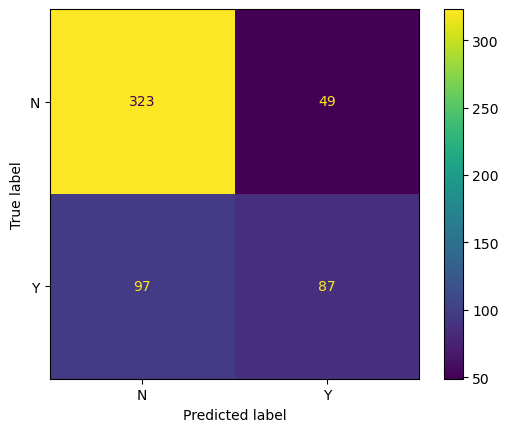

In [130]:
y_pred = cross_val_predict(random_forest, X, y, cv=s_kfold, n_jobs=-1)

print(classification_report(y, y_pred, zero_division=0))

labels = y.unique()
cm = confusion_matrix(y, y_pred, labels=labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot()
plt.show()

We evaluated the Random Forest classifier using 5-fold stratified cross-validation. The model achieved a mean accuracy of 73.7% and a mean AUC-ROC of 0.769, with low standard deviations across folds. This indicates that the model is relatively stable and performs consistently, although it is still far from being a 'ready to implement' model in the field of medicine. The AUC-ROC value suggests that the model can distinguish between the classes with an acceptable discriminative power, which is particularly relevant in clinical applications where misclassification costs may differ.

As previously discussed, we now compute the closed sequential patterns using minimum support thresholds of 20% and 30%, in addition to the initial 25%. This sensitivity analysis allows us to assess whether varying the support threshold has a positive or negative impact on the model’s performance, both in terms of predictive accuracy and generalisation.

In [131]:
os.system( "java -jar spmf_PD.jar run Fournier08-Closed+time input.txt output_20.txt 20% 0 4 0 4")

0

In [132]:
os.system( "java -jar spmf_PD.jar run Fournier08-Closed+time input.txt output_30.txt 30% 0 4 0 4")

0

In [133]:
seq_patterns_20 = None
seq_patterns_30 = None

for output_file in ["output_20.txt", "output_30.txt"]:
    patterns = []
    supports = []
    sequence_ids = []

    with open(output_file, "r", encoding="utf-8") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            
            pattern_part, rest = line.split(" #SUP:")
            support_part, sid_part = rest.strip().split(" #SID:")

            pattern = [[item.strip() for item in itemset.strip().split()] 
                       for itemset in pattern_part.split('|') if itemset.strip()]
            
            support = int(support_part.strip())
            sids = list(map(int, sid_part.strip().split()))

            patterns.append(pattern)
            supports.append(support)
            sequence_ids.append(sids)

    df = pd.DataFrame({
        "pattern": patterns,
        "support": supports,
        "sequence_ids": sequence_ids
    })

    
    if "20" in output_file:
        seq_patterns_20 = df
    elif "30" in output_file:
        seq_patterns_30 = df
   

In [134]:
display(seq_patterns_20.sort_values(by='support', ascending=True).head(10))
display(seq_patterns_30.sort_values(by='support', ascending=True).head(10))
print("Number of patterns with support >= 20%:", len(seq_patterns_20))
print("Number of patterns with support >= 25%:", len(seq_patterns))
print("Number of patterns with support >= 30%:", len(seq_patterns_30))

,pattern,support,sequence_ids
0,"[[<0>, ALSFRSsLL=<4], [<1>, ALSFRSsT=[4,8[]]",112,"[0, 1, 258, 516, 264, 9, 265, 12, 270, 528, 17..."
5173,"[[<0>, ALSFRSb=>=12, ALSFRSsLL=<4], [<1>, ALSF...",112,"[0, 1, 258, 9, 10, 12, 14, 270, 528, 276, 21, ..."
5172,"[[<0>, ALSFRSb=>=12, ALSFRSsLL=<4, ALSFRS-R=>=...",112,"[0, 1, 258, 518, 8, 264, 9, 12, 268, 270, 16, ..."
11337,"[[<0>, ALSFRSsT=[4,8[, R=>=12, ALSFRS-R=>=36],...",112,"[259, 6, 268, 13, 525, 15, 273, 274, 530, 276,..."
11328,"[[<0>, ALSFRSsT=[4,8[, R=>=12, ALSFRS-R=>=36],...",112,"[259, 515, 6, 262, 520, 11, 268, 13, 525, 526,..."
1351,"[[<0>, R=>=12, ALSFRS-R=>=36], [<1>, ALSFRSb=>...",112,"[0, 259, 6, 8, 9, 12, 268, 14, 15, 271, 273, 2..."
8119,"[[<0>, ALSFRSb=>=12, ALSFRS-R=>=36], [<1>, ALS...",112,"[0, 259, 6, 8, 9, 12, 268, 271, 273, 276, 22, ..."
5157,"[[<0>, ALSFRSb=>=12], [<1>, ALSFRSsUL=[4,8[, A...",112,"[259, 6, 264, 11, 268, 15, 271, 528, 273, 530,..."
1360,"[[<0>, R=>=12, ALSFRS-R=>=36], [<1>, ALSFRSb=>...",112,"[0, 6, 8, 9, 12, 268, 14, 15, 271, 273, 276, 2..."
8126,"[[<0>, ALSFRSb=>=12, ALSFRS-R=>=36], [<1>, ALS...",112,"[0, 259, 6, 8, 9, 11, 12, 268, 15, 271, 273, 2..."


,pattern,support,sequence_ids
558,"[[<0>, ALSFRS-R=>=36], [<2>, ALSFRSb=>=12, ALS...",167,"[0, 1, 259, 6, 8, 264, 9, 11, 12, 268, 15, 271..."
1504,"[[<0>, ALSFRSsT=[4,8[, ALSFRS-R=>=36], [<1>, A...",167,"[0, 512, 259, 6, 8, 9, 11, 12, 268, 13, 14, 15..."
1329,"[[<0>, ALSFRSsT=[4,8[, ALSFRSsLL=[4,8[, R=>=12...",167,"[0, 512, 259, 515, 8, 520, 522, 268, 13, 525, ..."
71,"[[<0>, ALSFRSsLL=[4,8[, ALSFRS-R=>=36], [<1>, ...",167,"[0, 512, 3, 259, 262, 518, 8, 521, 268, 13, 27..."
930,"[[<0>, ALSFRSb=>=12, ALSFRSsT=[4,8[, ALSFRS-R=...",167,"[0, 1, 259, 6, 8, 9, 11, 12, 268, 14, 15, 271,..."
587,"[[<0>, ALSFRS-R=>=36], [<1>, ALSFRS-R=>=36], [...",167,"[0, 259, 260, 6, 262, 11, 267, 268, 13, 15, 27..."
140,"[[<0>, R=>=12], [<1>, ALSFRSsT=[4,8[, ALSFRS-R...",167,"[0, 259, 6, 8, 9, 12, 268, 15, 271, 17, 273, 2..."
939,"[[<0>, ALSFRSb=>=12, ALSFRSsT=[4,8[], [<1>, AL...",167,"[0, 1, 259, 6, 8, 264, 9, 11, 12, 268, 14, 15,..."
940,"[[<0>, ALSFRSb=>=12, ALSFRSsT=[4,8[], [<1>, AL...",167,"[0, 512, 259, 6, 8, 264, 9, 11, 12, 268, 14, 1..."
585,"[[<0>, ALSFRS-R=>=36], [<1>, ALSFRS-R=>=36], [...",167,"[0, 259, 6, 262, 8, 9, 11, 12, 268, 13, 14, 15..."


Number of patterns with support >= 20%: 12453
Number of patterns with support >= 25%: 4218
Number of patterns with support >= 30%: 1600


In [135]:
static_features_encoded = static_features.copy()
categorical_cols = ['Gender', 'Revised El Escorial Criteria', 'Onset', 'MND familiar history', 'C9orf72']

for col in categorical_cols:
    le = LabelEncoder()
    static_features_encoded[col] = le.fit_transform(static_features_encoded[col].astype(str))

imputer = SimpleImputer(strategy='median')
static_features_encoded['BMI at 1st visit'] = imputer.fit_transform(static_features_encoded[['BMI at 1st visit']])
static_features_indexed = static_features_encoded.set_index('REF')

seq_sets = [('20', seq_patterns_20), ('30', seq_patterns_30)]

for suffix, seq_df in seq_sets:
    patient_refs = temp_filt_df['REF'].unique()
    binary_matrix = np.zeros((len(patient_refs), len(seq_df)), dtype=int)

    for pat_idx, sids in enumerate(seq_df['sequence_ids']):
        for sid in sids:
            binary_matrix[sid, pat_idx] = 1

    binary_df = pd.DataFrame(
        binary_matrix,
        index=patient_refs,
        columns=[f'pattern_{i}' for i in range(len(seq_df))]
    )

    X_local = static_features_indexed.join(binary_df, how='inner')

    globals()[f'X_{suffix}'] = X_local


In [136]:
display(X_20.head(10))
display(X_30.head(10))

,Gender,Age at onset (years),Revised El Escorial Criteria,Onset,Diagnostic delay (months),BMI at 1st visit,MND familiar history,C9orf72,pattern_0,pattern_1,pattern_2,pattern_3,pattern_4,pattern_5,pattern_6,pattern_7,pattern_8,pattern_9,pattern_10,pattern_11,pattern_12,pattern_13,pattern_14,pattern_15,pattern_16,pattern_17,pattern_18,pattern_19,pattern_20,pattern_21,pattern_22,pattern_23,pattern_24,pattern_25,pattern_26,pattern_27,pattern_28,pattern_29,pattern_30,pattern_31,pattern_32,pattern_33,pattern_34,pattern_35,pattern_36,pattern_37,pattern_38,pattern_39,pattern_40,pattern_41,pattern_42,pattern_43,pattern_44,pattern_45,pattern_46,pattern_47,pattern_48,pattern_49,pattern_50,pattern_51,pattern_52,pattern_53,pattern_54,pattern_55,pattern_56,pattern_57,pattern_58,pattern_59,pattern_60,pattern_61,pattern_62,pattern_63,pattern_64,pattern_65,pattern_66,pattern_67,pattern_68,pattern_69,pattern_70,pattern_71,pattern_72,pattern_73,pattern_74,pattern_75,pattern_76,pattern_77,pattern_78,pattern_79,pattern_80,pattern_81,pattern_82,pattern_83,pattern_84,pattern_85,pattern_86,pattern_87,pattern_88,pattern_89,pattern_90,pattern_91,pattern_92,pattern_93,pattern_94,pattern_95,pattern_96,pattern_97,pattern_98,pattern_99,pattern_100,pattern_101,pattern_102,pattern_103,pattern_104,pattern_105,pattern_106,pattern_107,pattern_108,pattern_109,pattern_110,pattern_111,pattern_112,pattern_113,pattern_114,pattern_115,pattern_116,pattern_117,pattern_118,pattern_119,pattern_120,pattern_121,pattern_122,pattern_123,pattern_124,pattern_125,pattern_126,pattern_127,pattern_128,pattern_129,pattern_130,pattern_131,pattern_132,pattern_133,pattern_134,pattern_135,pattern_136,pattern_137,pattern_138,pattern_139,pattern_140,pattern_141,pattern_142,pattern_143,pattern_144,pattern_145,pattern_146,pattern_147,pattern_148,pattern_149,pattern_150,pattern_151,pattern_152,pattern_153,pattern_154,pattern_155,pattern_156,pattern_157,pattern_158,pattern_159,pattern_160,pattern_161,pattern_162,pattern_163,pattern_164,pattern_165,pattern_166,pattern_167,pattern_168,pattern_169,pattern_170,pattern_171,pattern_172,pattern_173,pattern_174,pattern_175,pattern_176,pattern_177,pattern_178,pattern_179,pattern_180,pattern_181,pattern_182,pattern_183,pattern_184,pattern_185,pattern_186,pattern_187,pattern_188,pattern_189,pattern_190,pattern_191,pattern_192,pattern_193,pattern_194,pattern_195,pattern_196,pattern_197,pattern_198,pattern_199,pattern_200,pattern_201,pattern_202,pattern_203,pattern_204,pattern_205,pattern_206,pattern_207,pattern_208,pattern_209,pattern_210,pattern_211,pattern_212,pattern_213,pattern_214,pattern_215,pattern_216,pattern_217,pattern_218,pattern_219,pattern_220,pattern_221,pattern_222,pattern_223,pattern_224,pattern_225,pattern_226,pattern_227,pattern_228,pattern_229,pattern_230,pattern_231,pattern_232,pattern_233,pattern_234,pattern_235,pattern_236,pattern_237,pattern_238,pattern_239,pattern_240,pattern_241,pattern_242,pattern_243,pattern_244,pattern_245,pattern_246,pattern_247,pattern_248,pattern_249,pattern_250,pattern_251,pattern_252,pattern_253,pattern_254,pattern_255,pattern_256,pattern_257,pattern_258,pattern_259,pattern_260,pattern_261,pattern_262,pattern_263,pattern_264,pattern_265,pattern_266,pattern_267,pattern_268,pattern_269,pattern_270,pattern_271,pattern_272,pattern_273,pattern_274,pattern_275,pattern_276,pattern_277,pattern_278,pattern_279,pattern_280,pattern_281,pattern_282,pattern_283,pattern_284,pattern_285,pattern_286,pattern_287,pattern_288,pattern_289,pattern_290,pattern_291,pattern_292,pattern_293,pattern_294,pattern_295,pattern_296,pattern_297,pattern_298,pattern_299,pattern_300,pattern_301,pattern_302,pattern_303,pattern_304,pattern_305,pattern_306,pattern_307,pattern_308,pattern_309,pattern_310,pattern_311,pattern_312,pattern_313,pattern_314,pattern_315,pattern_316,pattern_317,pattern_318,pattern_319,pattern_320,pattern_321,pattern_322,pattern_323,pattern_324,pattern_325,pattern_326,pattern_327,pattern_328,pattern_329,pattern_330,pa

Gender  Age at onset (years)  Revised El Escorial Criteria  Onset  \
REF                                                                      
2         1                 54.92                             4      1   
9         1                 72.17                             2      1   
14        0                 61.63                             0      1   
17        0                 73.09                             4      0   
20        0                 36.49                             0      1   
21        0                 45.26                             4      0   
24        0                 35.41                             2      1   
26        0                 79.88                             4      0   
34        1                 53.05                             1      1   
35        1                 56.93                             4      1   

     Diagnostic delay (months)  BMI at 1st visit  MND familiar history  \
REF                                                                      
2                         5.22             17.90                     0   
9                        27.93             26.61                     0   
14                       26.02             21.08                     0   
17                       33.84             30.04                     0   
20                       12.58             22.76                     0   
21                        8.34             30.00                     0   
24                       16.69             22.77                     1   
26                       12.91             24.46                     0   
34                       36.34             25.64                     0   
35                        9.59             27.48                     0   

     C9orf72  pattern_0  pattern_1  pattern_2  pattern_3  pattern_4  \
REF                                                                   
2          2          1          0          1          1          1   
9          0          1          1          1          1          0   
14         2          0          1          1          1          0   
17         2          0          0          0          0          0   
20         2          1          1          1          1          0   
21         2          0          0          0          0          0   
24         2          0          0          0          0          0   
26         2          0          0          0          0          0   
34         0          1          0          0          1          1   
35         2          1          0          1          1          0   

     pattern_5  pattern_6  pattern_7  pattern_8  pattern_9  pattern_10  \
REF                                                                      
2            1          1          1          1          1           1   
9            0          1          0          0          0           0   
14           0          0          0          0          0           0   
17           0          0          0          0          0           0   
20           0          0          0          0          0           0   
21           0          0          0          0          0           0   
24           0          0          0          0          0           0   
26           0          0          0          0          0           0   
34           1          1          1          1          1           1   
35           0          0          0          0          0           0   

     pattern_11  pattern_12  pattern_13  pattern_14  pattern_15  pattern_16  \
REF                                                                           
2             1           1           1           0           0           1   
9             0           0           0           0           1           1   
14            0           0           0           0           0           0   
17            0           0           0           0           0           0   
20         

In [137]:
s_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
random_forest = RandomForestClassifier(random_state=42)

for suffix, X_set in [('20', X_20), ('25', X),('30', X_30)]:
    acc_scores = cross_val_score(random_forest, X_set, y, cv=s_kfold, n_jobs=-1)
    auc_scores = cross_val_score(random_forest, X_set, y, cv=s_kfold, scoring='roc_auc', n_jobs=-1)

    print(f"Support {suffix}%:")
    print(f"  Accuracy: {acc_scores.mean():.3f} ± {acc_scores.std():.3f}")
    print(f"  AUC-ROC:  {auc_scores.mean():.3f} ± {auc_scores.std():.3f}\n")

Support 20%:
  Accuracy: 0.734 ± 0.036
  AUC-ROC:  0.762 ± 0.046

Support 25%:
  Accuracy: 0.737 ± 0.040
  AUC-ROC:  0.769 ± 0.047

Support 30%:
  Accuracy: 0.730 ± 0.039
  AUC-ROC:  0.756 ± 0.049



Among the tested support thresholds (20%, 25%, 30%), a value of 25% yielded the best overall performance, achieving the highest AUC-ROC and slightly better accuracy. This suggests that 25% offers an optimal balance between pattern representativeness and feature discriminativeness. Lower support (20%) introduces more patterns, potentially increasing noise, while higher support (30%) may exclude informative patterns shared by fewer patients. Also, the similarity in classification performance across support thresholds suggests that the additional temporal patterns extracted with lower support values did not substantially impact model performance. This may indicate that only a subset of the temporal patterns contribute meaningfully, or that temporal features, as constructed, provide limited additional discriminative power over the static features alone.